In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import model_selection
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVR
from sklearn import metrics
from pprint import pprint
from sklearn.model_selection import RandomizedSearchCV


In [2]:
data = pd.read_csv("concrete.csv")
data.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [3]:
data.shape

(1030, 9)

In [4]:
data.describe()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


In [5]:
data.nunique()

cement          278
slag            185
ash             156
water           195
superplastic    111
coarseagg       284
fineagg         302
age              14
strength        845
dtype: int64

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   cement        1030 non-null   float64
 1   slag          1030 non-null   float64
 2   ash           1030 non-null   float64
 3   water         1030 non-null   float64
 4   superplastic  1030 non-null   float64
 5   coarseagg     1030 non-null   float64
 6   fineagg       1030 non-null   float64
 7   age           1030 non-null   int64  
 8   strength      1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [7]:
data.dtypes

cement          float64
slag            float64
ash             float64
water           float64
superplastic    float64
coarseagg       float64
fineagg         float64
age               int64
strength        float64
dtype: object

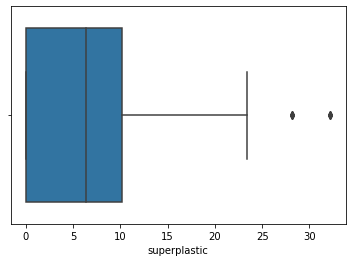

In [8]:
sns.boxplot(data['superplastic'])

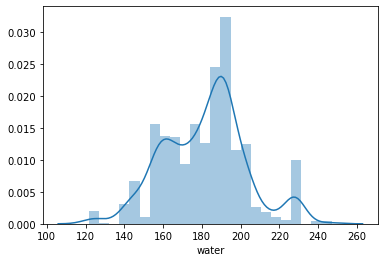

In [9]:
sns.distplot(data['water'])

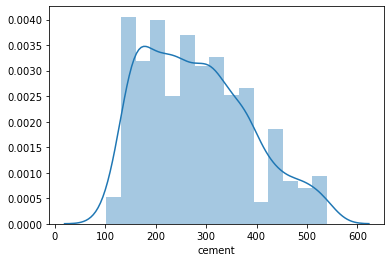

In [10]:
sns.distplot(data['cement'])

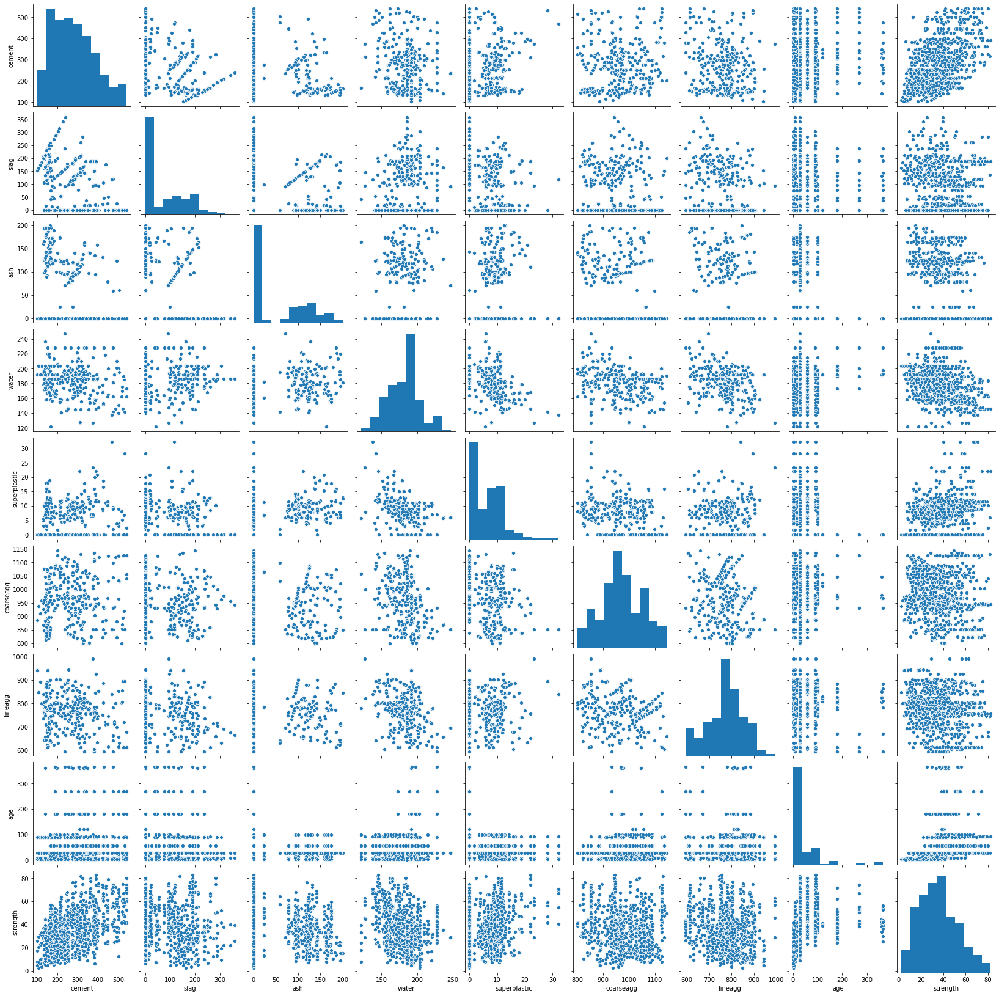

In [11]:
sns.pairplot(data)

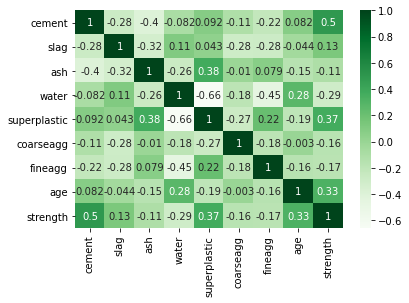

In [12]:
corr = data.corr() 
sns.heatmap(corr, annot=True, cmap='Greens')

In [13]:
#Splitting of the data in 70 30 ratio
x = data.drop('strength',axis=1)
y = data['strength']
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.3,random_state=1)

In [14]:
#linear regression
lr = LinearRegression() 
lr.fit(x_train,y_train)
y_pred_lr = lr.predict(x_test)

In [15]:
print("Linear Regression:\n\n\t RMSE \t\t R2") 
print(" \t {:.2f} \t\t{:.2f}".format(np.sqrt(mean_squared_error(y_test, y_pred_lr)), r2_score(y_test, y_pred_lr)))

Linear Regression:

	 RMSE 		 R2
 	 10.32 		0.63


In [16]:
#Decision Tree Regressor
dt = DecisionTreeRegressor()
dt.fit(x_train,y_train)
y_pred_dt = dt.predict(x_test)

In [17]:
print("Decision Tree:\n\n\t RMSE \t\t R2") 
print(""" \t {:.2f} \t\t{:.2f}""".format(np.sqrt(mean_squared_error(y_test, y_pred_dt)), r2_score(y_test, y_pred_dt)))

Decision Tree:

	 RMSE 		 R2
 	 6.22 		0.87


In [18]:
#Random Forest
rf_model = RandomForestRegressor()
rf_model.fit(x_train, y_train)
y_pred_rf = rf_model.predict(x_test) 

In [19]:
print("Random Forest:\n\n\t RMSE \t\t R2") 
print(""" \t {:.2f} \t\t{:.4f}""".format(np.sqrt(mean_squared_error(y_test, y_pred_rf)), r2_score(y_test, y_pred_rf))) 


Random Forest:

	 RMSE 		 R2
 	 5.18 		0.9080


In [20]:
#Bagging on Random Forest Regressor
rf = RandomForestRegressor()
bag_reg = BaggingRegressor(base_estimator=rf, n_estimators=100,bootstrap=True, n_jobs=-1,random_state=42)
bag_reg.fit(x_train,y_train)
bag_reg.score(x_train,y_train),bag_reg.score(x_test,y_test)


(0.9590425863571284, 0.8904100694284354)

In [21]:
#Boosting Regressor
ad = AdaBoostRegressor(n_estimators=100, learning_rate=0.03)
ad.fit(x_train, y_train)
ad.score(x_train, y_train), ad.score(x_test, y_test)

(0.7506071395128111, 0.6761496781926453)

In [22]:
#KFold Cross validation
kfold = model_selection.KFold(n_splits=10, random_state=100)
ranfor_kfold = RandomForestRegressor()
results_kfold = model_selection.cross_val_score(ranfor_kfold, x, y, cv=kfold)
print("Accuracy for Random Forest Regressor: %.2f%%" % (results_kfold.mean()*100.0)) 

Accuracy for Random Forest Regressor: 91.87%


In [23]:
results_kfold = model_selection.cross_val_score(ad, x, y, cv=kfold)
print("Accuracy for Boosting Regressor: %.2f%%" % (results_kfold.mean()*100.0))

Accuracy for Boosting Regressor: 70.04%


In [24]:
results_kfold = model_selection.cross_val_score(dt, x, y, cv=kfold)
print("Accuracy for Decision Tree: %.2f%%" % (results_kfold.mean()*100.0))

Accuracy for Decision Tree: 86.78%


In [25]:
model_compare = {'Accuracy score':['86%','89%','66%'],
                    'Accuracy Score using K-fold':['87.12%','91.72%','70.18%']}
df_model = pd.DataFrame(model_compare,index=['Decision Tree','Random Forest','Boosting Regressor'])
df_model

,Accuracy score,Accuracy Score using K-fold
Decision Tree,86%,87.12%
Random Forest,89%,91.72%
Boosting Regressor,66%,70.18%


In [26]:
#Random Search on the Random Forest Regressor

rf = RandomForestRegressor(random_state = 42)

# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


In [27]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [28]:
# Use the random grid to search for best hyperparameters for the Random Forest Regressor
# First create the base model to tune
rf = RandomForestRegressor(random_state = 42)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,
                              n_iter = 10, scoring='neg_mean_absolute_error', 
                              cv = 3, verbose=2, random_state=42, n_jobs=1,
                              return_train_score=True)

# Fit the random search model
rf_random.fit(x_train,y_train);

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=50, bootstrap=True 
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[CV]  n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=50, bootstrap=True, total=   0.3s
[CV] n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=50, bootstrap=True 
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[CV]  n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=50, bootstrap=True, total=   0.3s
[CV] n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=50, bootstrap=True 
[CV]  n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=50, bootstrap=True, total=   0.3s
[CV] n_estimators=600, min_samples_split=10, min_

In [29]:
rf_random.best_params_

{'n_estimators': 2000,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 50,
 'bootstrap': True}

In [30]:
rf_random.cv_results_

{'mean_fit_time': array([0.28073001, 0.54236698, 1.12515974, 1.64995138, 1.68064833,
        0.34647965, 3.40761932, 0.20518112, 1.63831258, 3.00387732]),
 'std_fit_time': array([0.00427782, 0.03223408, 0.1191469 , 0.19752441, 0.00548579,
        0.00219705, 0.06404534, 0.00104804, 0.01038708, 0.09753009]),
 'mean_score_time': array([0.01817052, 0.043437  , 0.04438035, 0.09955001, 0.07267944,
        0.02710096, 0.12712367, 0.01502061, 0.07435131, 0.12826228]),
 'std_score_time': array([0.00130994, 0.00658335, 0.00782729, 0.00970181, 0.01038227,
        0.0003934 , 0.00080083, 0.00061595, 0.00055395, 0.00081766]),
 'param_n_estimators': masked_array(data=[200, 600, 600, 1400, 1000, 400, 2000, 200, 1200, 2000],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'param_min_samples_split': masked_array(data=[10, 10, 2, 5, 10, 10, 2, 5, 2, 5],
              mask=[False, False, F

In [31]:
#Evaluate the model

def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy

base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(x_train, y_train)
base_accuracy = evaluate(base_model, x_train, y_train)

Model Performance
Average Error: 1.7387 degrees.
Accuracy = 93.91%.


In [32]:
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, x_train, y_train)
print('Improvement of {:0.2f}%.'.format( 100 * (random_accuracy - base_accuracy) / base_accuracy))

Model Performance
Average Error: 1.9243 degrees.
Accuracy = 93.20%.
Improvement of -0.76%.
